# Coursera IBM Data Science Capstone - Ankur Gyawali

## Table of contents
* [Introduction](#introduction)
* [Problem](#Problem)
* [Data Exploration](#Data_Exploration)
* [Data Preperation](#Data_Preperation)
* [Analysis&Modeling](#Analysis&Modeling)
* [Results&Discussion](#Results&Discussion)
* [Conclusion](#Conclusion)
* [Map](#Map)

<h1> Introduction</h1><a name="introduction"></a>

In the United States about 115 million cars hit the road everyday, anually 3 million people will get injured and 2 million will suffer from permenant injuries. People die from car accidents on average 90 per day at 37,000 per year, just in the United States alone. Inside each car is a driver who has their motivations to get places safely. As we innovate and adopt new technologies into our automobiles it has definetly gotten safer to drive. However accidents are still very much a sobering reminder of the dangers that still exist every time we make that trip. In order to limit risks on ourselves we require training for all drivers, wear seatbelts and drive carefully based on weather and road conditions.

To access full report:
https://ibmdatasciencecapstone.s3.us-east-2.amazonaws.com/capstone_report.pdf

<h1> Problem </h1><a name="Problem"></a>

We value the safety of every person on the road and want to limit the possibility of any severe or fatal car accidents. The objective of this project is to predict the severity of an accident based on different attributes in our data, such as road conditions, road-contour, light condition, etc. 

To provide the predicted severity of the accident a supervised machine learning classification model will be developed.

<h4>Target Audience</h4>

1. CDOT (Colorado Department of Transportation): By being able to predict the severity of an accident, CDOT can effectively plan road closures and utilize signs to warn drivers of the conditions.
2. First Responders: First responders can predict the sevirity of the accident they are responding to, allowing them to be better prepared when they arrive on scence.
3. Drivers in Denver: Drivers can predict the sevirity of accidents before leaving allowing them to alter travel plans if needed.

<h1>Data Exploration <h1> <a name="Data_Exploration"></a>

<h2>Understanding the data</h2>

I will be performing analysis based on traffic accident data in the Denver area. The dataset I will be using is the from the open data catalog, specifically it is the Traffic Accidents - Comma-Separated Values provided here: 

https://www.denvergov.org/opendata/dataset/city-and-county-of-denver-traffic-accidents

This dataset initially provided 44 attributes with 181,943 rows of motor vehicle crashes reported to the Denver Police Department, that occurred within the City and County of Denver from 2013 to now.

Below I have started the data exploration phase. I started by loading the csv into a dataframe, and looking at the head of the datframe. I then created my severity column based on the fatalities and seriously injured column. Lastly I looked at the shape of my data, as well as the data types and value counts of severity in my dataset. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('https://www.denvergov.org/media/gis/DataCatalog/traffic_accidents/csv/traffic_accidents.csv', index_col = 0)
df.head(5)

,INCIDENT_ID,OFFENSE_ID,OFFENSE_CODE,OFFENSE_CODE_EXTENSION,TOP_TRAFFIC_ACCIDENT_OFFENSE,FIRST_OCCURRENCE_DATE,LAST_OCCURRENCE_DATE,REPORTED_DATE,INCIDENT_ADDRESS,GEO_X,...,TU2_VEHICLE_MOVEMENT,TU2_DRIVER_ACTION,TU2_DRIVER_HUMANCONTRIBFACTOR,TU2_PEDESTRIAN_ACTION,SERIOUSLY_INJURED,FATALITIES,FATALITY_MODE_1,FATALITY_MODE_2,SERIOUSLY_INJURED_MODE_1,SERIOUSLY_INJURED_MODE_2
OBJECTID_1,,,,,,,,,,,,,,,,,,,,,
1,20193963.0,2019396354010,5401,0,TRAF - ACCIDENT - HIT & RUN,2019-01-02 20:50:00,NaN,2019-01-02 21:01:00,W COLFAX AVE / N FEDERAL BLVD,3133517.0,...,GOING STRAIGHT,OTHER,NO APPARENT,,0.0,0.0,,,,
2,20193966.0,2019396654410,5441,0,TRAF - ACCIDENT,2019-01-02 20:59:00,NaN,2019-01-02 20:59:00,N DELAWARE ST / W 8TH AVE,3142641.0,...,GOING STRAIGHT,OTHER,NO APPARENT,,0.0,0.0,,,,
3,20193991.0,2019399154010,5401,0,TRAF - ACCIDENT - HIT & RUN,2019-01-02 09:30:00,NaN,2019-01-02 21:14:00,5000 E 33RD AVE,3160492.0,...,PARKED,,,,0.0,0.0,,,,
4,20194077.0,2019407754410,5441,0,TRAF - ACCIDENT,2019-01-02 22:03:00,NaN,2019-01-02 22:46:00,W 48TH AVE / N BANNOCK ST,3143001.0,...,GOING STRAIGHT,OTHER,NO APPARENT,,0.0,0.0,,,,
5,20194189.0,2019418954200,5420,0,TRAF - ACCIDENT - DUI/DUID,2019-01-02 23:19:00,NaN,2019-01-02 23:34:00,I70 HWYWB / N PECOS ST,3138717.0,...,STOPPED IN TRAFFIC,OTHER,NO APPARENT,,0.0,0.0,,,,


<h4>Dataset Attributes</h4>

I called the .info() function on my data frame to get all the column names, their non null value counts, and datatypes here are the results:

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 182147 entries, 1 to 182147
Data columns (total 44 columns):
INCIDENT_ID                      182147 non-null float64
OFFENSE_ID                       182147 non-null int64
OFFENSE_CODE                     182147 non-null int64
OFFENSE_CODE_EXTENSION           182147 non-null int64
TOP_TRAFFIC_ACCIDENT_OFFENSE     182147 non-null object
FIRST_OCCURRENCE_DATE            182147 non-null object
LAST_OCCURRENCE_DATE             617 non-null object
REPORTED_DATE                    182147 non-null object
INCIDENT_ADDRESS                 182147 non-null object
GEO_X                            174967 non-null float64
GEO_Y                            174967 non-null float64
GEO_LON                          174967 non-null float64
GEO_LAT                          174967 non-null float64
DISTRICT_ID                      179370 non-null float64
PRECINCT_ID                      174942 non-null float64
NEIGHBORHOOD_ID                  174942 non-null

<h3>Adding Severity Values</h3>

The main variable I am trying to predict is severity but currently in this dataset there is no column for severity however, there are columns for fatalities and seriously injured. I started by creating a severity column where if there were no fatalities, and no one seriously injured severity was set to 0. If there were no fatalities but at least one person was seriously injured, then severity was set to 1. And if there were any fatalities then severity was set to 2. 

In [3]:
df['Severity'] = 0
def label_severity (row):
    if row['FATALITIES'] == 0 and row['SERIOUSLY_INJURED'] == 0 :
         return 0
    elif row['FATALITIES'] == 0 and row['SERIOUSLY_INJURED'] > 0 :
        return 1
    elif row['FATALITIES'] > 0:
        return 2
        
df['Severity'] = df.apply (lambda row: label_severity(row), axis=1)

In [4]:
df.shape

(182147, 45)

Below I have a breakdown of value counts of Severity Score in our dataset with 177512 at 0.0, 3722 at 1.0 and 385 at 2.0. Then there is a breakdown of the fatalities, and seriously injured value counts below it.

In [5]:
print(df['Severity'].value_counts())
print(df['FATALITIES'].value_counts())
print(df['SERIOUSLY_INJURED'].value_counts())

0.0    177671
1.0      3723
2.0       386
Name: Severity, dtype: int64
0.0    181394
1.0       369
2.0        16
3.0         1
Name: FATALITIES, dtype: int64
0.0    177985
1.0      3385
2.0       309
3.0        71
4.0        18
5.0         9
7.0         2
6.0         1
Name: SERIOUSLY_INJURED, dtype: int64


<h4>Analyzing addresses</h4>

Below we analyze the different addresses that accidents have happened at. We calculated that there are 39769 unique addresses in this dataset so using address as a predictor will not be feasible. However analyzing this still has value to see how much both interstates show up along with 6th ave which accounted for 2306 just in the top 10.

In [6]:
print("There are",df['INCIDENT_ADDRESS'].nunique(dropna = True) ,"unique addresses in this dataset.")
print(df['INCIDENT_ADDRESS'].value_counts())

There are 39784 unique addresses in this dataset.
I25 HWYNB / W 6TH AVE                 1260
I70 HWYEB / N HAVANA ST                789
I25 HWYNB / W ALAMEDA AVE              707
I70 HWYEB / N PEORIA ST                647
I25 HWYSB / 20TH ST                    592
W 6TH AVE / N FEDERAL BLVD             584
I25 HWYNB / 20TH ST                    562
I25 HWYNB / E HAMPDEN AVE              512
I25 HWYNB / W 23RD AVE                 484
I70 HWYEB / N NORTHFIELD QUEBEC ST     472
I25 HWYSB / W 6TH AVE                  468
I25 HWYNB / W COLFAX AVE               437
I25 HWYSB / W ALAMEDA AVE              419
I70 HWYWB / N PEORIA ST                413
I70 HWYEB / N CENTRAL PARK BLVD        394
8400 PENA BLVD                         392
I70 HWYWB / N HAVANA ST                377
I25 HWYNB / N SPEER BLVD               374
I25 HWYSB / N SPEER BLVD               372
I70 HWYEB / N PECOS ST                 368
I25 HWYNB / S SANTA FE DR              353
I25 HWYNB / S UNIVERSITY BLVD          352
I70 

<h3>Critical 13 attributes for my model.</h3>

After having a first look into the dataset I identified 13  attributes that would be critical for analysis and modeling.

<b>1. Road Conditions:</b> Below we will be doing a more in depth analysis into our road conditions since this is one of the most important variables we have.

The bar chart above shows the value counts of severity based on the road conditions. In the chart right now Dry is by far the biggest bar with over 15 thousand entries for it. Even though the other road conditions have severities of 1 and 2 they can't be seen on the graph because dry is so large. Right now there are 13 different road conditions including null values. I plan on dropping the null values with no road conditions. I will also combine the conditions down to 7: Dry, Foreign Material, Icy, Muddy, Slushy, Snowy, and Wet.

DRY                                       151207
WET                                        12116
                                            6010
ICY                                         5780
SNOWY                                       4420
SLUSHY                                      1105
UNDER INVESTIGATION                          367
SNOWY WITH VISIBLE ICY ROAD TREATMENT        323
WET WITH VISIBLE ICY ROAD TREATMENT          226
DRY WITH VISIBLE ICY ROAD TREATMENT          203
SLUSHY WITH VISIBLE ICY ROAD TREATMENT       160
ICY WITH VISIBLE ICY ROAD TREATMENT          148
MUDDY                                         53
FOREIGN MATERIAL                              29
Name: ROAD_CONDITION, dtype: int64


Severity,0.0,1.0,2.0
ROAD_CONDITION,,,
,5999.0,11.0,NaN
DRY,147542.0,3310.0,355.0
DRY WITH VISIBLE ICY ROAD TREATMENT,193.0,6.0,4.0
FOREIGN MATERIAL,27.0,2.0,NaN
ICY,5703.0,73.0,4.0
ICY WITH VISIBLE ICY ROAD TREATMENT,147.0,1.0,NaN
MUDDY,52.0,1.0,NaN
SLUSHY,1090.0,15.0,NaN
SLUSHY WITH VISIBLE ICY ROAD TREATMENT,154.0,6.0,NaN


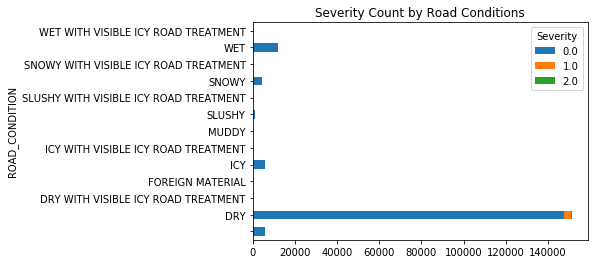

In [7]:
print(df['ROAD_CONDITION'].value_counts())
df_roadcond = df.groupby(['Severity','ROAD_CONDITION']).size().reset_index().pivot(columns='Severity', index='ROAD_CONDITION', values=0)
df_roadcond.plot(kind='barh', stacked=True, title='Severity Count by Road Conditions')
df_roadcond

<b>2. Top Traffic Accident Offense:</b> Below is the accident offense that occurred as reported by the police. What is alarming is that we have 408 accidents that are reported as fatal here but 385 total fatalities reported in total.

In [8]:
df['TOP_TRAFFIC_ACCIDENT_OFFENSE'].value_counts()

TRAF - ACCIDENT                   123671
TRAF - ACCIDENT - HIT & RUN        48693
TRAF - ACCIDENT - DUI/DUID          5119
TRAF - ACCIDENT - SBI               2453
TRAF - ACCIDENT - POLICE            1802
TRAF - ACCIDENT - FATAL              409
Name: TOP_TRAFFIC_ACCIDENT_OFFENSE, dtype: int64

<b>3. Road Contour: </b>Below we take a lok at the road contour values we have. There are 5706 empty strings we will convert to null values, as well as 324 that are under investigation, we will need to figure our how to approach those two problems.

In [9]:
df['ROAD_CONTOUR'].value_counts()

STRAIGHT ON-LEVEL      142229
STRAIGHT ON-GRADE       24444
                         5862
CURVE ON-LEVEL           5202
CURVE ON-GRADE           3569
HILLCREST                 474
UNDER INVESTIGATION       367
Name: ROAD_CONTOUR, dtype: int64

<b>4. Light Condition: </b>Below we see the light conditions for all of our accidents. We see that most of our accidents happen in day light. There are 6206 current empty strings that will be needed to convert into null values.

In [10]:
df['LIGHT_CONDITION'].value_counts()

DAY LIGHT              124766
DARK-LIGHTED            39625
DAWN OR DUSK             7394
                         6362
DARK-UNLIGHTED           3633
UNDER INVESTIGATION       367
Name: LIGHT_CONDITION, dtype: int64

<b>5. Vehicle Type:</b> Below we have the different types of vehicles involved in these accidents and their counts. Since there are two vehicles involved in an accident I added both vehicles types up and divided by 2 to get the averages.

In [11]:
print((df['TU1_VEHICLE_TYPE'].value_counts() + df['TU2_VEHICLE_TYPE'].value_counts())/2)

                                          15003.0
BICYCLE                                    1139.0
FARM EQUIPMENT                               16.0
HIT AND RUN UNKNOWN                        6660.5
LIGHT RAIL                                   49.5
MOTOR HOME                                   92.5
MOTORCYCLE                                 1173.5
MOTORIZED BICYCLE                            73.0
NON-SCHOOL BUS                              486.0
OTHER                                      1696.5
PASSENGER CAR/VAN                         88115.5
PASSENGER CAR/VAN WITH TRAILER              344.0
PICKUP TRUCK/UTILITY VAN                  18180.0
PICKUP TRUCK/UTILITY VAN WITH TRAILIER     3713.5
SCHOOL BUS                                  273.5
SUV                                       38661.0
SUV WITH TRAILER                            149.5
TRANSIT BUS                                1006.0
UNDER INVESTIGATION                         367.0
VEHICLE OVER 10000 LBS                     4947.5


<b>6. Travel Direction:</b> This indicates which direction the driver was going when the accident occurred. Looking at the value counts of travel direction, we can see that most accidents happen when traveling north. We also have different directions such as northwest that we will convert into one of the main 4 cardinal directions. However we also have 8314 values that are blank, we will need to convert into null values and figure out what to do with them. 

In [12]:
df['TU1_TRAVEL_DIRECTION'].value_counts()

NORTH                  46407
SOUTH                  41848
WEST                   36337
EAST                   36094
                        8470
NORTHWEST               3546
SOUTHEAST               3313
SOUTHWEST               2838
NORTHEAST               2715
UNDER INVESTIGATION      367
OTHER                    212
Name: TU1_TRAVEL_DIRECTION, dtype: int64

<b>7. Vehicle Movement:</b> This attribute indicates what movement the vehicle was making when the accident happened. Vast majority of the values are 'GOING STRAIGHT'.

In [13]:
df['TU1_VEHICLE_MOVEMENT'].value_counts()

GOING STRAIGHT                      92041
MAKING LEFT TURN                    21458
CHANGING LANES                      14459
BACKING                             10067
                                     9121
MAKING RIGHT TURN                    8279
OTHER                                6584
ENTERING/LEAVING PARKED POSITION     5148
SLOWING                              4918
SPUN OUT OF CONTROL                  2231
WEAVING                              2059
STOPPED IN TRAFFIC                   1552
MAKING U-TURN                        1306
PASSING                              1104
PARKED                                816
UNDER INVESTIGATION                   367
DROVE WRONG WAY                       328
AVOIDING OBJECT IN ROADWAY            309
Name: TU1_VEHICLE_MOVEMENT, dtype: int64

<b>8. Bicycle Indicator:</b> This indicates how many bikes were involved in each accident. The vast majority of accidents there are no bikes involved.

In [14]:
df['BICYCLE_IND'].value_counts()

0.0    174244
1.0      2342
2.0        15
4.0         1
Name: BICYCLE_IND, dtype: int64

<b>9. Road Location:</b> This indicates where the car was following the crash. Most of the values indicate it is still on the roadway.

In [15]:
df['ROAD_LOCATION'].value_counts()

ON ROADWAY                                           155007
ON PRIVATE PROPERTY                                   14109
                                                       6220
RAN OFF RIGHT SIDE                                     3733
RAN OFF LEFT SIDE                                      2074
VEHICLE CROSSED CENTER MEDIAN INTO OPPOSING LANES       404
UNDER INVESTIGATION                                     367
RAN OFF 'T' INTERSECTION                                233
Name: ROAD_LOCATION, dtype: int64

<b>10. Road Description:</b> This indicates where specifically the accident happens. Mostly of the values indicate non intersectional accidents. Will combine "AT INTERSECTION" with "INTERSECTION RELATED" to become Intersection Related.

In [16]:
df['ROAD_DESCRIPTION'].value_counts()

NON INTERSECTION           73126
AT INTERSECTION            55888
INTERSECTION RELATED       16396
PARKING LOT                13117
HIGHWAY INTERCHANGE         9530
                            5783
DRIVEWAY ACCESS RELATED     5225
ALLEY RELATED               2147
ROUNDABOUT                   568
UNDER INVESTIGATION          367
Name: ROAD_DESCRIPTION, dtype: int64

<b>11. Pedestrian Ind:</b> This indicates how many pedestrians were involved with each crash. Vast majority of accidents there are no pedestrians involved.

In [17]:
df['PEDESTRIAN_IND'].value_counts()

0.0    172770
1.0      3673
2.0       133
3.0        23
4.0         3
Name: PEDESTRIAN_IND, dtype: int64

<b>12. District ID:</b> This is the count of accidents that happended in each district. This is the denver county's police district and not congressional districts.

In [18]:
df['DISTRICT_ID'].value_counts()

3.0    51059
1.0    35322
6.0    25415
2.0    25190
5.0    20217
4.0    19519
7.0     2648
Name: DISTRICT_ID, dtype: int64

<b>13. Neighborhood ID:</b> This is the count of accidents within each police department defined neighborhood.

In [19]:
print("There are",df['NEIGHBORHOOD_ID'].nunique(dropna = True),"unique neighborhoods in this dataset.")
df['NEIGHBORHOOD_ID'].value_counts() 

There are 79 unique neighborhoods in this dataset.


Stapleton                       8558
Baker                           8454
Five Points                     5892
Hampden South                   5491
Lincoln Park                    5152
Capitol Hill                    5062
Montbello                       4631
Globeville                      4419
Highland                        4145
Elyria Swansea                  3720
Northeast Park Hill             3661
CBD                             3632
Speer                           3483
Westwood                        3375
Gateway - Green Valley Ranch    3293
Congress Park                   3171
Civic Center                    2969
Washington Virginia Vale        2964
Union Station                   2872
DIA                             2862
Cherry Creek                    2832
Washington Park West            2714
Jefferson Park                  2601
Hampden                         2533
North Capitol Hill              2526
Virginia Village                2314
Cheesman Park                   2235
M

<h3>Checking current null values</h3>

Before we make any alterations to the data we can see the null values that are currently in our data. However based on exploration we know there is more nulls in our dataset than is listed right now because there are a lot of empty strings in our dataset and we will need to convert those into null values before continuing.

In [20]:
df.isnull().sum()

INCIDENT_ID                           0
OFFENSE_ID                            0
OFFENSE_CODE                          0
OFFENSE_CODE_EXTENSION                0
TOP_TRAFFIC_ACCIDENT_OFFENSE          0
FIRST_OCCURRENCE_DATE                 0
LAST_OCCURRENCE_DATE             181530
REPORTED_DATE                         0
INCIDENT_ADDRESS                      0
GEO_X                              7180
GEO_Y                              7180
GEO_LON                            7180
GEO_LAT                            7180
DISTRICT_ID                        2777
PRECINCT_ID                        7205
NEIGHBORHOOD_ID                    7205
BICYCLE_IND                        5545
PEDESTRIAN_IND                     5545
HARMFUL_EVENT_SEQ_1                   0
HARMFUL_EVENT_SEQ_2                   0
HARMFUL_EVENT_SEQ_3                   0
ROAD_LOCATION                         0
ROAD_DESCRIPTION                      0
ROAD_CONTOUR                          0
ROAD_CONDITION                        0


<h1> Data Preperation <h1><a name="Data_Preperation"></a>

In the previous section we took time to understand our data, in this section we will be making changes to our data in order to get it ready for modeling. We will be dropping unecessary columns, dropping null values, converting datatypes, cleaning categorical values and handling missing values. 

<h3>Dropping unecessary columns</h3>

After doing some exploratory analysis I start by dropping the columns I determined I do not need. The columns are: ['INCIDENT_ID',  'OFFENSE_ID',  'OFFENSE_CODE', 'OFFENSE_CODE_EXTENSION',  'LAST_OCCURRENCE_DATE',  'INCIDENT_ADDRESS', 'GEO_X', 'GEO_Y', 'HARMFUL_EVENT_SEQ_2', 'HARMFUL_EVENT_SEQ_3', 'TU1_PEDESTRIAN_ACTION', 'TU2_VEHICLE_TYPE', 'TU2_TRAVEL_DIRECTION', 'TU2_VEHICLE_MOVEMENT', 'TU2_DRIVER_ACTION', 'TU2_DRIVER_HUMANCONTRIBFACTOR', 'TU2_PEDESTRIAN_ACTION', 'FATALITY_MODE_1', 'FATALITY_MODE_2', 'SERIOUSLY_INJURED_MODE_1', 'SERIOUSLY_INJURED_MODE_2', 'TU1_DRIVER_HUMANCONTRIBFACTOR', 'TU1_DRIVER_ACTION','PRECINCT_ID', 'HARMFUL_EVENT_SEQ_1', 'REPORTED_DATE'].  There are various reasons for dropping these columns, mainly it does not seem like a logical predictor for severity of an accident, or the data might have been missing or there could’ve been too many unique values in the column to make it worth working with.

In [21]:
df = df.drop(['INCIDENT_ID', 'OFFENSE_ID', 'OFFENSE_CODE', 'OFFENSE_CODE_EXTENSION', 'LAST_OCCURRENCE_DATE', 'INCIDENT_ADDRESS', 'GEO_X','GEO_Y','HARMFUL_EVENT_SEQ_2','HARMFUL_EVENT_SEQ_3','TU1_PEDESTRIAN_ACTION','TU2_VEHICLE_TYPE','TU2_TRAVEL_DIRECTION','TU2_VEHICLE_MOVEMENT','TU2_DRIVER_ACTION','TU2_DRIVER_HUMANCONTRIBFACTOR','TU2_PEDESTRIAN_ACTION','FATALITY_MODE_1','FATALITY_MODE_2','SERIOUSLY_INJURED_MODE_1','SERIOUSLY_INJURED_MODE_2','TU1_DRIVER_HUMANCONTRIBFACTOR','TU1_DRIVER_ACTION','PRECINCT_ID','HARMFUL_EVENT_SEQ_1','REPORTED_DATE'], axis=1)
df.shape

(182147, 19)

We noticed that  lot of blank spaces for values, we want to convert those blank spaces into null values by calling the replace function below. 

In [22]:
df = df.replace(r'^\s*$', np.nan, regex=True)

Now we check the sum of null values for all of our columns again. We can see this actually drastically increased our actual null values in our dataset. 

In [23]:
df.isnull().sum()

TOP_TRAFFIC_ACCIDENT_OFFENSE       0
FIRST_OCCURRENCE_DATE              0
GEO_LON                         7180
GEO_LAT                         7180
DISTRICT_ID                     2777
NEIGHBORHOOD_ID                 7205
BICYCLE_IND                     5545
PEDESTRIAN_IND                  5545
ROAD_LOCATION                   6220
ROAD_DESCRIPTION                5783
ROAD_CONTOUR                    5862
ROAD_CONDITION                  6010
LIGHT_CONDITION                 6362
TU1_VEHICLE_TYPE                8367
TU1_TRAVEL_DIRECTION            8470
TU1_VEHICLE_MOVEMENT            9121
SERIOUSLY_INJURED                367
FATALITIES                       367
Severity                         367
dtype: int64

<h3>Expanding our date column to Year, Month, Day, Hour and Weekday columns.</h3>

First I convert the datatype of our FIRST_OCCURRENCE_DATE to a datetime data type. Then I split up that column to Year, Month, Day, Hour and Day Of Week. Using the dt.weekday function will return a numerical value of 0-6 where 0 is a monday and 6 is sunday. So I created a function convert the number to its actual associated day of week and applied that function. When we look at our results we see that we have some unusual rows with years in 1969 and 1923, we will need to clean that up later on. Lastly we drop the FIRST_OCCURRENCE_DATE column at the end.

In [24]:
df['FIRST_OCCURRENCE_DATE'] = pd.to_datetime(df['FIRST_OCCURRENCE_DATE'])
df['Year'] = df['FIRST_OCCURRENCE_DATE'].dt.year
df['Month'] = df['FIRST_OCCURRENCE_DATE'].dt.month
df['Day'] = df['FIRST_OCCURRENCE_DATE'].dt.day
df['Hour'] = df['FIRST_OCCURRENCE_DATE'].dt.hour
df['Weekday']= df['FIRST_OCCURRENCE_DATE'].dt.weekday
df['Day Of Week']= df['FIRST_OCCURRENCE_DATE'].dt.weekday

In [25]:
def weekday_conversion (row):
    if row['Day Of Week'] == 0 :
         return 'Monday'
    elif row['Day Of Week'] == 1 :
        return 'Tuesday'
    elif row['Day Of Week'] == 2 :
        return 'Wednesday'
    elif row['Day Of Week'] == 3 :
        return 'Thursday'
    elif row['Day Of Week'] == 4 :
        return 'Friday'
    elif row['Day Of Week'] == 5 :
        return 'Saturday'
    elif row['Day Of Week'] == 6 :
        return 'Sunday'
        
df['Day Of Week'] = df.apply (lambda row: weekday_conversion(row), axis=1)

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 182147 entries, 1 to 182147
Data columns (total 25 columns):
TOP_TRAFFIC_ACCIDENT_OFFENSE    182147 non-null object
FIRST_OCCURRENCE_DATE           182147 non-null datetime64[ns]
GEO_LON                         174967 non-null float64
GEO_LAT                         174967 non-null float64
DISTRICT_ID                     179370 non-null float64
NEIGHBORHOOD_ID                 174942 non-null object
BICYCLE_IND                     176602 non-null float64
PEDESTRIAN_IND                  176602 non-null float64
ROAD_LOCATION                   175927 non-null object
ROAD_DESCRIPTION                176364 non-null object
ROAD_CONTOUR                    176285 non-null object
ROAD_CONDITION                  176137 non-null object
LIGHT_CONDITION                 175785 non-null object
TU1_VEHICLE_TYPE                173780 non-null object
TU1_TRAVEL_DIRECTION            173677 non-null object
TU1_VEHICLE_MOVEMENT            173026 non-null obj

In [27]:
df = df.drop(['FIRST_OCCURRENCE_DATE'], axis=1)
print(df['Year'].value_counts())
print(df['Month'].value_counts())
print(df['Day'].value_counts())
print(df['Weekday'].value_counts())
print(df['Day Of Week'].value_counts())
print(df['Hour'].value_counts())
df.loc[:4,['Year', 'Month', 'Day', 'Weekday', 'Hour' ,'Day Of Week']]

2017    25787
2016    25471
2018    25425
2015    24999
2019    24634
2014    23349
2013    22011
2020    10441
2012       15
2010        4
2011        3
2003        1
1969        1
2001        1
1916        1
2005        1
2006        1
2007        1
1923        1
Name: Year, dtype: int64
8     16447
1     16028
7     15900
10    15719
9     15430
6     15398
5     15347
2     14936
3     14399
12    14349
11    14180
4     14014
Name: Month, dtype: int64
21    6260
14    6198
8     6185
11    6129
6     6127
17    6110
3     6105
20    6105
2     6104
5     6104
12    6073
10    6068
4     6064
19    6057
18    6056
13    6048
9     6034
15    6032
16    6001
7     5989
1     5944
22    5865
23    5862
28    5788
24    5773
27    5664
25    5608
26    5577
29    5403
30    5280
31    3534
Name: Day, dtype: int64
4    30680
3    28955
2    28255
1    27719
0    26069
5    22093
6    18376
Name: Weekday, dtype: int64
Friday       30680
Thursday     28955
Wednesday    28255
Tuesday     

,Year,Month,Day,Weekday,Hour,Day Of Week
OBJECTID_1,,,,,,
1,2019,1,2,2,20,Wednesday
2,2019,1,2,2,20,Wednesday
3,2019,1,2,2,9,Wednesday
4,2019,1,2,2,22,Wednesday


<h3>Dropping null values</h3>

There are different ways to handle null values. For our critical columns it does not become worth it to use different methods to try and fill them. We will be utilizing different methods later for other columns, but we start by dropping the rows below that have null values in these columns.

In [28]:
df = df.dropna(subset=['Severity','ROAD_CONDITION','ROAD_LOCATION','ROAD_DESCRIPTION','ROAD_CONTOUR','LIGHT_CONDITION','BICYCLE_IND'])

In [29]:
print(df.shape)
df.isnull().sum()

(174258, 24)


TOP_TRAFFIC_ACCIDENT_OFFENSE       0
GEO_LON                         6794
GEO_LAT                         6794
DISTRICT_ID                     2597
NEIGHBORHOOD_ID                 6808
BICYCLE_IND                        0
PEDESTRIAN_IND                     0
ROAD_LOCATION                      0
ROAD_DESCRIPTION                   0
ROAD_CONTOUR                       0
ROAD_CONDITION                     0
LIGHT_CONDITION                    0
TU1_VEHICLE_TYPE                2627
TU1_TRAVEL_DIRECTION            2645
TU1_VEHICLE_MOVEMENT            3313
SERIOUSLY_INJURED                  0
FATALITIES                         0
Severity                           0
Year                               0
Month                              0
Day                                0
Hour                               0
Weekday                            0
Day Of Week                        0
dtype: int64

<b>Creating new geo dataframe</b>

Two of the columns that have null columns are geo_lon and geo_lat. These values pinpoint the exact location where the accident happened. We will be making a map later that maps where our accidents happened, its severity and what accident offense it got. We copy these columns into a new data frame called df_geo and then drop the longitude and latitude columns from our original df data frame.  Now we have 5 columns left with null values. 

In [30]:
df_geo = df[['GEO_LON','GEO_LAT','Severity','TOP_TRAFFIC_ACCIDENT_OFFENSE']].copy()
df = df.drop(['GEO_LON','GEO_LAT'], axis=1)
print(df.info())
df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 174258 entries, 1 to 182147
Data columns (total 22 columns):
TOP_TRAFFIC_ACCIDENT_OFFENSE    174258 non-null object
DISTRICT_ID                     171661 non-null float64
NEIGHBORHOOD_ID                 167450 non-null object
BICYCLE_IND                     174258 non-null float64
PEDESTRIAN_IND                  174258 non-null float64
ROAD_LOCATION                   174258 non-null object
ROAD_DESCRIPTION                174258 non-null object
ROAD_CONTOUR                    174258 non-null object
ROAD_CONDITION                  174258 non-null object
LIGHT_CONDITION                 174258 non-null object
TU1_VEHICLE_TYPE                171631 non-null object
TU1_TRAVEL_DIRECTION            171613 non-null object
TU1_VEHICLE_MOVEMENT            170945 non-null object
SERIOUSLY_INJURED               174258 non-null float64
FATALITIES                      174258 non-null float64
Severity                        174258 non-null float64
Yea

TOP_TRAFFIC_ACCIDENT_OFFENSE       0
DISTRICT_ID                     2597
NEIGHBORHOOD_ID                 6808
BICYCLE_IND                        0
PEDESTRIAN_IND                     0
ROAD_LOCATION                      0
ROAD_DESCRIPTION                   0
ROAD_CONTOUR                       0
ROAD_CONDITION                     0
LIGHT_CONDITION                    0
TU1_VEHICLE_TYPE                2627
TU1_TRAVEL_DIRECTION            2645
TU1_VEHICLE_MOVEMENT            3313
SERIOUSLY_INJURED                  0
FATALITIES                         0
Severity                           0
Year                               0
Month                              0
Day                                0
Hour                               0
Weekday                            0
Day Of Week                        0
dtype: int64

In the new geo dataframe we drop the null values of longitude and latitude.

In [31]:
df_geo = df_geo.dropna(subset=['GEO_LON','GEO_LAT'])
print(df_geo.info())
df_geo.isnull().sum()
df_geo.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 167464 entries, 1 to 182147
Data columns (total 4 columns):
GEO_LON                         167464 non-null float64
GEO_LAT                         167464 non-null float64
Severity                        167464 non-null float64
TOP_TRAFFIC_ACCIDENT_OFFENSE    167464 non-null object
dtypes: float64(3), object(1)
memory usage: 6.4+ MB
None


,GEO_LON,GEO_LAT,Severity,TOP_TRAFFIC_ACCIDENT_OFFENSE
OBJECTID_1,,,,
1,-105.025220,39.740476,0.0,TRAF - ACCIDENT - HIT & RUN
2,-104.992859,39.728937,0.0,TRAF - ACCIDENT
3,-104.929109,39.763614,0.0,TRAF - ACCIDENT - HIT & RUN
4,-104.991179,39.784074,0.0,TRAF - ACCIDENT
5,-105.006428,39.783265,0.0,TRAF - ACCIDENT - DUI/DUID


<h3>Cleaning Categorical Values</h3>

When we looked at our critical attributes earlier, we noticed the large amount of extra description that we decided we did not need. In this section below we will clean up values by combining them so we have less but more concise values in our dataset. This will aid our ML model later on.

<b>Cleaning road conditions</b>

In [32]:
df['ROAD_CONDITION'].value_counts()

DRY                                       149910
WET                                        12035
ICY                                         5735
SNOWY                                       4359
SLUSHY                                      1099
SNOWY WITH VISIBLE ICY ROAD TREATMENT        318
WET WITH VISIBLE ICY ROAD TREATMENT          225
DRY WITH VISIBLE ICY ROAD TREATMENT          197
SLUSHY WITH VISIBLE ICY ROAD TREATMENT       158
ICY WITH VISIBLE ICY ROAD TREATMENT          147
MUDDY                                         47
FOREIGN MATERIAL                              28
Name: ROAD_CONDITION, dtype: int64

In [33]:
df.loc[df['ROAD_CONDITION']=='SNOWY WITH VISIBLE ICY ROAD TREATMENT','ROAD_CONDITION'] = 'SNOWY'
df.loc[df['ROAD_CONDITION']=='WET WITH VISIBLE ICY ROAD TREATMENT','ROAD_CONDITION'] = 'WET'
df.loc[df['ROAD_CONDITION']=='DRY WITH VISIBLE ICY ROAD TREATMENT','ROAD_CONDITION'] = 'DRY'
df.loc[df['ROAD_CONDITION']=='SLUSHY WITH VISIBLE ICY ROAD TREATMENT','ROAD_CONDITION'] = 'SLUSHY'
df.loc[df['ROAD_CONDITION']=='ICY WITH VISIBLE ICY ROAD TREATMENT','ROAD_CONDITION'] = 'ICY'
df['ROAD_CONDITION'].value_counts()

DRY                 150107
WET                  12260
ICY                   5882
SNOWY                 4677
SLUSHY                1257
MUDDY                   47
FOREIGN MATERIAL        28
Name: ROAD_CONDITION, dtype: int64

<b>Cleaning Travel Direction<b/>

In [34]:
df['TU1_TRAVEL_DIRECTION'].value_counts()

NORTH        45965
SOUTH        41436
WEST         36005
EAST         35742
NORTHWEST     3509
SOUTHEAST     3272
SOUTHWEST     2811
NORTHEAST     2685
OTHER          188
Name: TU1_TRAVEL_DIRECTION, dtype: int64

In [35]:
df.loc[df['TU1_TRAVEL_DIRECTION']=='NORTHWEST','TU1_TRAVEL_DIRECTION'] = 'NORTH'
df.loc[df['TU1_TRAVEL_DIRECTION']=='SOUTHEAST','TU1_TRAVEL_DIRECTION'] = 'SOUTH'
df.loc[df['TU1_TRAVEL_DIRECTION']=='SOUTHWEST','TU1_TRAVEL_DIRECTION'] = 'SOUTH'
df.loc[df['TU1_TRAVEL_DIRECTION']=='NORTHEAST','TU1_TRAVEL_DIRECTION'] = 'NORTH'
df.loc[df['TU1_TRAVEL_DIRECTION']=='OTHER','TU1_TRAVEL_DIRECTION'] = 'NORTH'
df['TU1_TRAVEL_DIRECTION'].value_counts()

NORTH    52347
SOUTH    47519
WEST     36005
EAST     35742
Name: TU1_TRAVEL_DIRECTION, dtype: int64

<b>Cleaning Road Description</b>

In [36]:
df['ROAD_DESCRIPTION'].value_counts()

NON INTERSECTION           72449
AT INTERSECTION            55470
INTERSECTION RELATED       16269
PARKING LOT                12749
HIGHWAY INTERCHANGE         9455
DRIVEWAY ACCESS RELATED     5188
ALLEY RELATED               2115
ROUNDABOUT                   563
Name: ROAD_DESCRIPTION, dtype: int64

In [37]:
df.loc[df['ROAD_DESCRIPTION']=='AT INTERSECTION','ROAD_DESCRIPTION'] = 'INTERSECTION RELATED'
df['ROAD_DESCRIPTION'].value_counts()

NON INTERSECTION           72449
INTERSECTION RELATED       71739
PARKING LOT                12749
HIGHWAY INTERCHANGE         9455
DRIVEWAY ACCESS RELATED     5188
ALLEY RELATED               2115
ROUNDABOUT                   563
Name: ROAD_DESCRIPTION, dtype: int64

<b>Cleaning Vehicle Type</b>

In [38]:
df['TU1_VEHICLE_TYPE'].value_counts()

PASSENGER CAR/VAN                         86877
SUV                                       37362
PICKUP TRUCK/UTILITY VAN                  19088
HIT AND RUN UNKNOWN                       12551
VEHICLE OVER 10000 LBS                     5699
PICKUP TRUCK/UTILITY VAN WITH TRAILIER     4009
OTHER                                      1625
MOTORCYCLE                                 1110
BICYCLE                                    1042
TRANSIT BUS                                 847
NON-SCHOOL BUS                              433
PASSENGER CAR/VAN WITH TRAILER              321
SCHOOL BUS                                  266
SUV WITH TRAILER                            149
MOTOR HOME                                  129
MOTORIZED BICYCLE                            77
LIGHT RAIL                                   25
FARM EQUIPMENT                               21
Name: TU1_VEHICLE_TYPE, dtype: int64

In [39]:
df.loc[df['TU1_VEHICLE_TYPE']=='PICKUP TRUCK/UTILITY VAN WITH TRAILIER','TU1_VEHICLE_TYPE'] = 'PICKUP TRUCK/UTILITY VAN'
df.loc[df['TU1_VEHICLE_TYPE']=='TRANSIT BUS','TU1_VEHICLE_TYPE'] = 'BUS'
df.loc[df['TU1_VEHICLE_TYPE']=='NON-SCHOOL BUS','TU1_VEHICLE_TYPE'] = 'BUS'
df.loc[df['TU1_VEHICLE_TYPE']=='SCHOOL BUS','TU1_VEHICLE_TYPE'] = 'BUS'
df.loc[df['TU1_VEHICLE_TYPE']=='PASSENGER CAR/VAN WITH TRAILER','TU1_VEHICLE_TYPE'] = 'PASSENGER CAR/VAN'
df.loc[df['TU1_VEHICLE_TYPE']=='SUV WITH TRAILER','TU1_VEHICLE_TYPE'] = 'SUV'
df['TU1_VEHICLE_TYPE'].value_counts()

PASSENGER CAR/VAN           87198
SUV                         37511
PICKUP TRUCK/UTILITY VAN    23097
HIT AND RUN UNKNOWN         12551
VEHICLE OVER 10000 LBS       5699
OTHER                        1625
BUS                          1546
MOTORCYCLE                   1110
BICYCLE                      1042
MOTOR HOME                    129
MOTORIZED BICYCLE              77
LIGHT RAIL                     25
FARM EQUIPMENT                 21
Name: TU1_VEHICLE_TYPE, dtype: int64

<h3>Handling missing values</h3>

Like we said there are different ways to handle missing data. The two I will put into use is replacing missing data with the most frequent data in the set and replacing the missing with current distribution of values in the dataset. 

In [40]:
df.isnull().sum()

TOP_TRAFFIC_ACCIDENT_OFFENSE       0
DISTRICT_ID                     2597
NEIGHBORHOOD_ID                 6808
BICYCLE_IND                        0
PEDESTRIAN_IND                     0
ROAD_LOCATION                      0
ROAD_DESCRIPTION                   0
ROAD_CONTOUR                       0
ROAD_CONDITION                     0
LIGHT_CONDITION                    0
TU1_VEHICLE_TYPE                2627
TU1_TRAVEL_DIRECTION            2645
TU1_VEHICLE_MOVEMENT            3313
SERIOUSLY_INJURED                  0
FATALITIES                         0
Severity                           0
Year                               0
Month                              0
Day                                0
Hour                               0
Weekday                            0
Day Of Week                        0
dtype: int64

<b>Filling Vehicle Types</b>

For vehicle type I replaced all the missing values with the most common value, from exploring our data we know that will be Passenger Car/Van and we are ok with that. I do that with this code:

In [41]:
df['TU1_VEHICLE_TYPE'] = df['TU1_VEHICLE_TYPE'].fillna(df['TU1_VEHICLE_TYPE'].mode().iloc[0])
df.isnull().sum()

TOP_TRAFFIC_ACCIDENT_OFFENSE       0
DISTRICT_ID                     2597
NEIGHBORHOOD_ID                 6808
BICYCLE_IND                        0
PEDESTRIAN_IND                     0
ROAD_LOCATION                      0
ROAD_DESCRIPTION                   0
ROAD_CONTOUR                       0
ROAD_CONDITION                     0
LIGHT_CONDITION                    0
TU1_VEHICLE_TYPE                   0
TU1_TRAVEL_DIRECTION            2645
TU1_VEHICLE_MOVEMENT            3313
SERIOUSLY_INJURED                  0
FATALITIES                         0
Severity                           0
Year                               0
Month                              0
Day                                0
Hour                               0
Weekday                            0
Day Of Week                        0
dtype: int64

<b>Filling Vehicle Movement</b>

For vehicle movement I also replaced missing data with the most common value. 

In [42]:
df['TU1_VEHICLE_MOVEMENT'] = df['TU1_VEHICLE_MOVEMENT'].fillna(df['TU1_VEHICLE_MOVEMENT'].mode().iloc[0])
df.isnull().sum()

TOP_TRAFFIC_ACCIDENT_OFFENSE       0
DISTRICT_ID                     2597
NEIGHBORHOOD_ID                 6808
BICYCLE_IND                        0
PEDESTRIAN_IND                     0
ROAD_LOCATION                      0
ROAD_DESCRIPTION                   0
ROAD_CONTOUR                       0
ROAD_CONDITION                     0
LIGHT_CONDITION                    0
TU1_VEHICLE_TYPE                   0
TU1_TRAVEL_DIRECTION            2645
TU1_VEHICLE_MOVEMENT               0
SERIOUSLY_INJURED                  0
FATALITIES                         0
Severity                           0
Year                               0
Month                              0
Day                                0
Hour                               0
Weekday                            0
Day Of Week                        0
dtype: int64

<b>Filling Travel Direction</b>

For travel direction, district id, and neighborhood id we replace missing values with the current distribution of data in the dataset. For example, if North makes up 60% of the values currently it will stay that way after filling it. Here is how I did this:

In [44]:
s = df['TU1_TRAVEL_DIRECTION'].value_counts(normalize=True)
missing = df['TU1_TRAVEL_DIRECTION'].isnull()
df.loc[missing,'TU1_TRAVEL_DIRECTION'] = np.random.choice(s.index, size=len(df[missing]),p=s.values)
df.isnull().sum()

TOP_TRAFFIC_ACCIDENT_OFFENSE       0
DISTRICT_ID                     2597
NEIGHBORHOOD_ID                 6808
BICYCLE_IND                        0
PEDESTRIAN_IND                     0
ROAD_LOCATION                      0
ROAD_DESCRIPTION                   0
ROAD_CONTOUR                       0
ROAD_CONDITION                     0
LIGHT_CONDITION                    0
TU1_VEHICLE_TYPE                   0
TU1_TRAVEL_DIRECTION               0
TU1_VEHICLE_MOVEMENT               0
SERIOUSLY_INJURED                  0
FATALITIES                         0
Severity                           0
Year                               0
Month                              0
Day                                0
Hour                               0
Weekday                            0
Day Of Week                        0
dtype: int64

In [45]:
df['TU1_TRAVEL_DIRECTION'].value_counts()

NORTH    53152
SOUTH    48246
WEST     36530
EAST     36330
Name: TU1_TRAVEL_DIRECTION, dtype: int64

<b>Filling District and Neighborhood Columns</b>

For the district and neighborhood columns I do the same thing, I replaced null values with the current distribution of the values in our dataset. 

In [46]:
s = df['DISTRICT_ID'].value_counts(normalize=True)
missing = df['DISTRICT_ID'].isnull()
df.loc[missing,'DISTRICT_ID'] = np.random.choice(s.index, size=len(df[missing]),p=s.values)


s = df['NEIGHBORHOOD_ID'].value_counts(normalize=True)
missing = df['NEIGHBORHOOD_ID'].isnull()
df.loc[missing,'NEIGHBORHOOD_ID'] = np.random.choice(s.index, size=len(df[missing]),p=s.values)

df.isnull().sum()

TOP_TRAFFIC_ACCIDENT_OFFENSE    0
DISTRICT_ID                     0
NEIGHBORHOOD_ID                 0
BICYCLE_IND                     0
PEDESTRIAN_IND                  0
ROAD_LOCATION                   0
ROAD_DESCRIPTION                0
ROAD_CONTOUR                    0
ROAD_CONDITION                  0
LIGHT_CONDITION                 0
TU1_VEHICLE_TYPE                0
TU1_TRAVEL_DIRECTION            0
TU1_VEHICLE_MOVEMENT            0
SERIOUSLY_INJURED               0
FATALITIES                      0
Severity                        0
Year                            0
Month                           0
Day                             0
Hour                            0
Weekday                         0
Day Of Week                     0
dtype: int64

<h3>Converting categorical variables to booleans</h3>

For machine learning models we cannot input columns that have categorical datatypes. So, we expand our columns to be Booleans for its values. For example, instead of inputting a travel direction column that’s values could be north, south, west, east we make 4 new columns for north, south, west, and east. The only values for these columns are 0,1 (0 is false and 1 is true). 

<b>Road Conditions</b>

In [47]:
df['Dry'] = np.where(df['ROAD_CONDITION'].str.contains('DRY', case=False, na = False), 1, 0)
df['Wet'] = np.where(df['ROAD_CONDITION'].str.contains('WET', case=False, na = False), 1, 0)
df['Icy'] = np.where(df['ROAD_CONDITION'].str.contains('ICY', case=False, na = False), 1, 0)
df['Snowy'] = np.where(df['ROAD_CONDITION'].str.contains('SNOWY', case=False, na = False), 1, 0)
df['Slushy'] = np.where(df['ROAD_CONDITION'].str.contains('SLUSHY', case=False, na = False), 1, 0)
Road_Condition = ['Dry','Wet','Icy','Snowy','Slushy']
df = df.drop(['ROAD_CONDITION'], axis=1)

<b>Road Description</b>

In [48]:
df['Non Intersection'] = np.where(df['ROAD_DESCRIPTION'].str.contains('NON INTERSECTION', case=False, na = False), 1, 0)
df['Intersection Related'] = np.where(df['ROAD_DESCRIPTION'].str.contains('INTERSECTION RELATED', case=False, na = False), 1, 0)
Road_Description = ['Non Intersection','Intersection Related']
df = df.drop(['ROAD_DESCRIPTION'], axis=1)

<b>Vehicle Type</b>

In [49]:
df['Passenger Car/Van'] = np.where(df['TU1_VEHICLE_TYPE'].str.contains('PASSENGER CAR/VAN', case=False, na = False), 1, 0)
df['Suv'] = np.where(df['TU1_VEHICLE_TYPE'].str.contains('SUV', case=False, na = False), 1, 0)
df['Pickup Truck/Utility Van'] = np.where(df['TU1_VEHICLE_TYPE'].str.contains('PICKUP TRUCK/UTILITY VAN', case=False, na = False), 1, 0)
Vehicle_Type = ['Passenger Car/Van','Suv','Pickup Truck/Utility Van']
df = df.drop(['TU1_VEHICLE_TYPE'], axis=1)

<b>Light Condition</b>

In [50]:
df['Day Light'] = np.where(df['LIGHT_CONDITION'].str.contains('DAY LIGHT', case=False, na = False), 1, 0)
df['Dark Lighted'] = np.where(df['LIGHT_CONDITION'].str.contains('DARK-LIGHTED', case=False, na = False), 1, 0)
df['Dawn or Dusk'] = np.where(df['LIGHT_CONDITION'].str.contains('DAWN OR DUSK', case=False, na = False), 1, 0)
df['Dark Unlighted'] = np.where(df['LIGHT_CONDITION'].str.contains('DARK-UNLIGHTED', case=False, na = False), 1, 0)
Light_Condition = ['Day Light','Dark Lighted','Dawn or Dusk','Dark Unlighted']
df = df.drop(['LIGHT_CONDITION'], axis=1)

<b>Travel Direction</b>

In [51]:
df['Traveling North'] = np.where(df['TU1_TRAVEL_DIRECTION'].str.contains('North', case=False, na = False), 1, 0)
df['Traveling South'] = np.where(df['TU1_TRAVEL_DIRECTION'].str.contains('South', case=False, na = False), 1, 0)
df['Traveling West'] = np.where(df['TU1_TRAVEL_DIRECTION'].str.contains('West', case=False, na = False), 1, 0)
df['Traveling East'] = np.where(df['TU1_TRAVEL_DIRECTION'].str.contains('East', case=False, na = False), 1, 0)
Travel_Direction = ['Traveling North','Traveling South','Traveling West','Traveling East']
df = df.drop(['TU1_TRAVEL_DIRECTION'], axis=1)

In [52]:
df = df.drop(['SERIOUSLY_INJURED','FATALITIES'], axis=1)

<h1> Analysis & Modeling </h1> <a name="Analysis&Modeling"></a>

<h2>Analysis</h2>

In the previous section we dropped columns, expanded our datetime values, cleaned up categorical values, fixed our missing values and added booleans for categorical values. Now that our data is fully preppped we can do analysis using statistics and then finally develop and evaluate our machine learning models.

Now that our dataset is complete and clean with no null values, we can continue to analyze our data in depth. Let us start by looking at the correlation between our variables. 

In [53]:
df.corr()

,DISTRICT_ID,BICYCLE_IND,PEDESTRIAN_IND,Severity,Year,Month,Day,Hour,Weekday,Dry,...,Suv,Pickup Truck/Utility Van,Day Light,Dark Lighted,Dawn or Dusk,Dark Unlighted,Traveling North,Traveling South,Traveling West,Traveling East
DISTRICT_ID,1.000000,0.030933,0.040881,0.006827,0.013211,-0.001388,0.004659,0.001808,0.024498,-0.020630,...,0.001988,-0.020115,-0.037179,0.041954,-0.004992,0.002177,-0.021505,-0.015331,0.034429,0.006761
BICYCLE_IND,0.030933,1.000000,-0.014253,0.074222,-0.007901,0.015571,0.003841,0.015572,-0.007339,0.031169,...,-0.027636,-0.026058,0.013792,-0.015268,0.004203,-0.005001,-0.006095,-0.003838,0.008242,0.002877
PEDESTRIAN_IND,0.040881,-0.014253,1.000000,0.208286,-0.007608,0.002855,-0.002738,0.017874,0.006784,0.005826,...,-0.020986,-0.020020,-0.036821,0.031023,0.006303,0.017218,-0.010130,0.007728,0.002845,0.000118
Severity,0.006827,0.074222,0.208286,1.000000,-0.008596,0.006758,-0.001421,0.000623,0.029247,0.016565,...,-0.012411,-0.014904,-0.053032,0.053574,0.001639,0.009161,-0.008160,-0.003927,0.007878,0.005679
Year,0.013211,-0.007901,-0.007608,-0.008596,1.000000,-0.083934,-0.010083,-0.008993,-0.007812,0.031337,...,0.034305,0.010488,0.016720,-0.023469,-0.000400,0.016292,-0.007788,-0.004790,0.009646,0.004437
Month,-0.001388,0.015571,0.002855,0.006758,-0.083934,1.000000,-0.000112,0.005740,0.001131,0.084549,...,-0.005505,-0.001828,-0.021610,0.019437,0.007303,0.001393,0.002545,-0.000355,-0.002310,-0.000180
Day,0.004659,0.003841,-0.002738,-0.001421,-0.010083,-0.000112,1.000000,0.002562,0.003236,-0.002191,...,0.000404,0.000970,0.004036,-0.002624,-0.004677,0.001465,0.002675,0.000152,-0.003245,0.000052
Hour,0.001808,0.015572,0.017874,0.000623,-0.008993,0.005740,0.002562,1.000000,0.007358,0.018873,...,0.032807,-0.015290,-0.170641,0.158710,0.049251,0.007533,0.019673,-0.001291,-0.003687,-0.017180
Weekday,0.024498,-0.007339,0.006784,0.029247,-0.007812,0.001131,0.003236,0.007358,1.000000,0.009060,...,0.006017,-0.023485,-0.148118,0.149424,-0.004543,0.039093,0.006068,0.001562,-0.005065,-0.003522
Dry,-0.020630,0.031169,0.005826,0.016565,0.031337,0.084549,-0.002191,0.018873,0.009060,1.000000,...,-0.013748,0.001180,0.089740,-0.071776,-0.034595,-0.026047,0.011418,0.005218,-0.010657,-0.008010


<h3>Severity and Year</h3>

We look at how severity has compared year by year with the graphs we created. The last column(2020) has lesser values because the year is not complete.  

First we check if we still need to clean year values. Since there are no values pre 2013 anymore it seems that dropping null values for other columns also cleaned up our year column.

In [54]:
df['Year'].value_counts()

2017    24948
2016    24829
2018    24753
2015    24449
2014    22740
2019    22606
2013    21342
2020     8591
Name: Year, dtype: int64

Lets start by making visualizations to see the severity counts of car crashes throughout the years.

In [55]:
year = df.groupby(["Year",'Severity']).size().unstack()
print(year)

Severity    0.0  1.0  2.0
Year                     
2013      20761  539   42
2014      22118  577   45
2015      23875  523   51
2016      24276  498   55
2017      24457  444   47
2018      24200  494   59
2019      22116  431   59
2020       8373  192   26


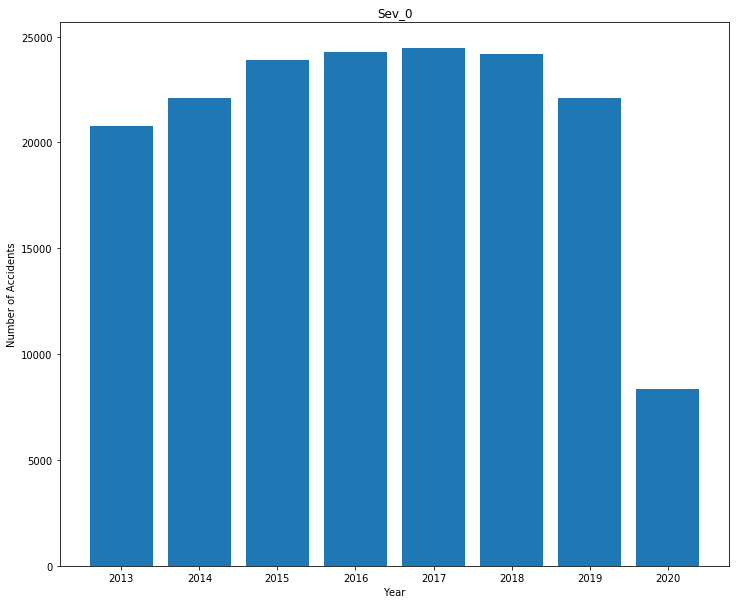

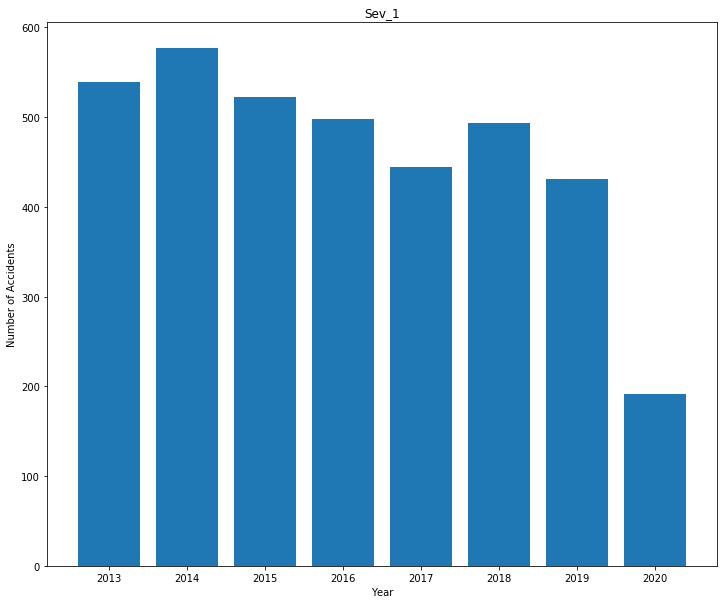

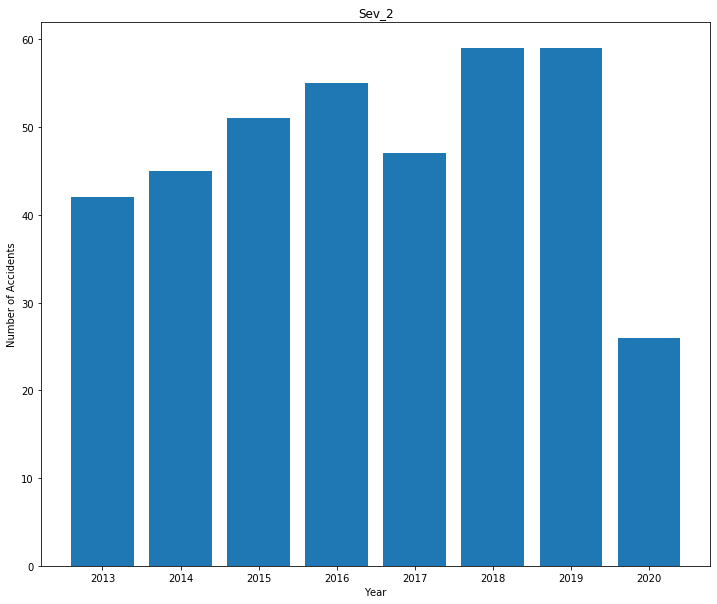

In [56]:
years = np.array(['2013', '2014', '2015', '2016', '2017', '2018', '2019','2020'])
numYears = years.shape[0]

sev0 = df['Year'].loc[df['Severity']==0.0].value_counts()
sev1 = df['Year'].loc[df['Severity']==1.0].value_counts()
sev2 = df['Year'].loc[df['Severity']==2.0].value_counts()

d = {'Year': years, 'Sev_0': sev0, 'Sev_1': sev1, 'Sev_2': sev2}
df_year = pd.DataFrame(data=d)

# Create plots
for i in range(3):
    yData = "Sev_" + str(i)
    plt.figure(figsize=(12,10))
    
    plt.title(yData)
    plt.bar(df_year.Year, df_year[yData].to_numpy())
    plt.xlabel('Year')
    plt.ylabel('Number of Accidents')

<h3>Severity and Month</h3>

Here we do like what we did with year above. For months and severity, it seems that most accidents with Severity 0 happen around January and the summer months. For severity of 1 it seems to peak around the fall months starting with August until it bottoms around February and rising again after that. For severity 2 accidents the summer and January seem to be the most fatal months.

In [57]:
month = df.groupby(['Month','Severity']).size().unstack()
print(month)

Severity    0.0  1.0  2.0
Month                    
1         15331  279   34
2         14227  234   21
3         13374  303   37
4         13121  288   31
5         14581  310   38
6         14484  311   38
7         14291  326   39
8         14613  364   36
9         14179  354   33
10        14857  343   30
11        13468  303   24
12        13650  283   23


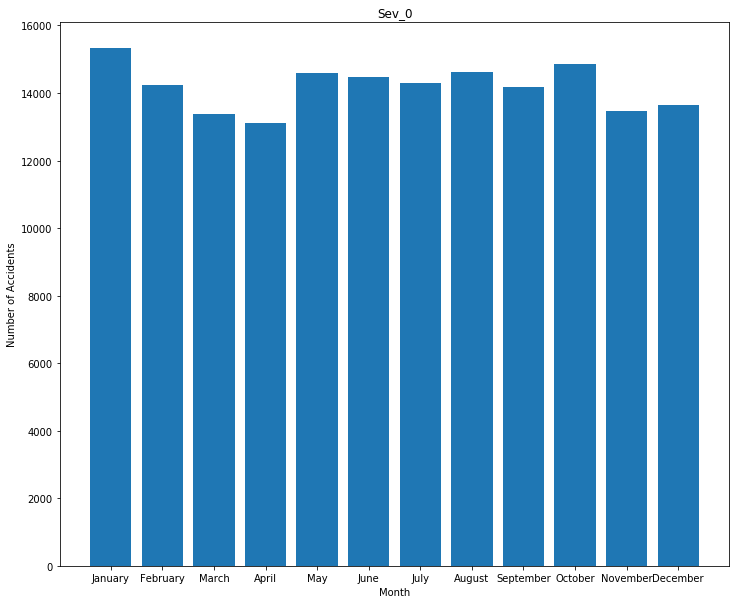

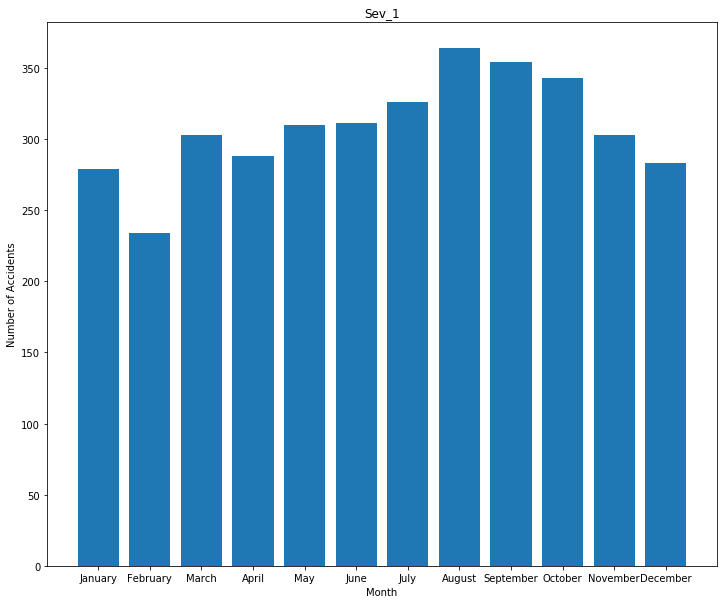

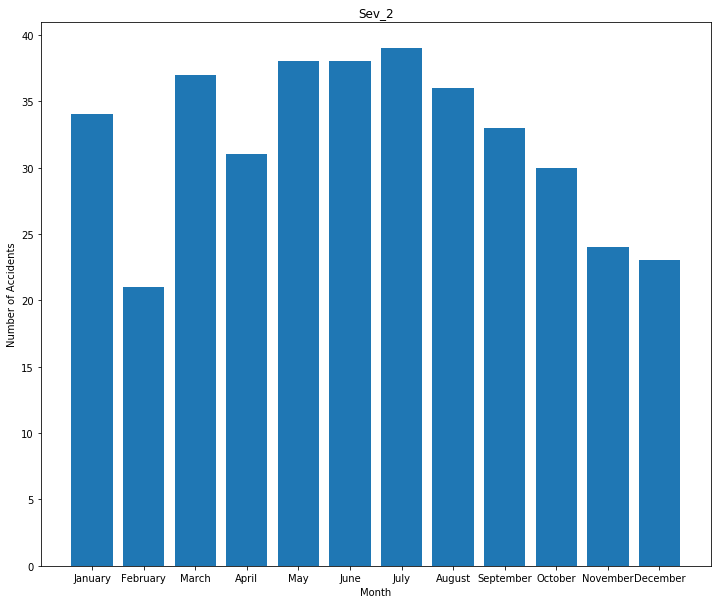

In [58]:
months = np.array(['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])
numMonths = months.shape[0]
sev0 = df['Month'].loc[df['Severity']==0.0].value_counts()
sev1 = df['Month'].loc[df['Severity']==1.0].value_counts()
sev2 = df['Month'].loc[df['Severity']==2.0].value_counts()

d = {'Month': months, 'Sev_0': sev0, 'Sev_1': sev1, 'Sev_2': sev2}
df_months = pd.DataFrame(data=d)

# Create plots
for i in range(3):
    yData = "Sev_" + str(i)
    plt.figure(figsize=(12,10))
    
    plt.title(yData)
    plt.bar(df_months.Month, df_months[yData].to_numpy())
    plt.xlabel('Month')
    plt.ylabel('Number of Accidents')

<h3>Severity and Day of Week</h3>

We can see severity 0 peaks on Friday and Saturday Sundays are relatively less compared to the weekend. However, for severity 1 and 2 Friday- Sunday are the most common days sadly. 

In [59]:
dow = df.groupby(['Weekday','Severity']).size().unstack()
print(dow)

Severity    0.0  1.0  2.0
Weekday                  
0         24505  451   40
1         26055  474   42
2         26553  504   54
3         27082  552   47
4         28725  596   60
5         20394  606   75
6         16862  515   66


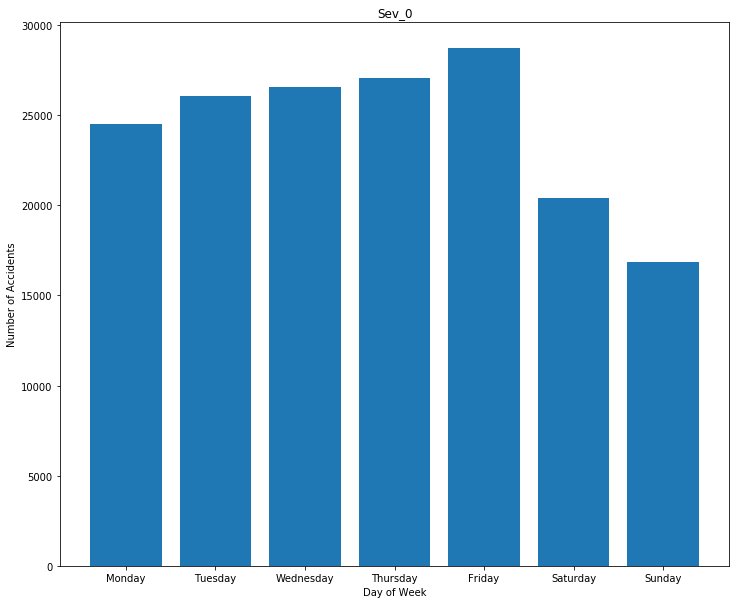

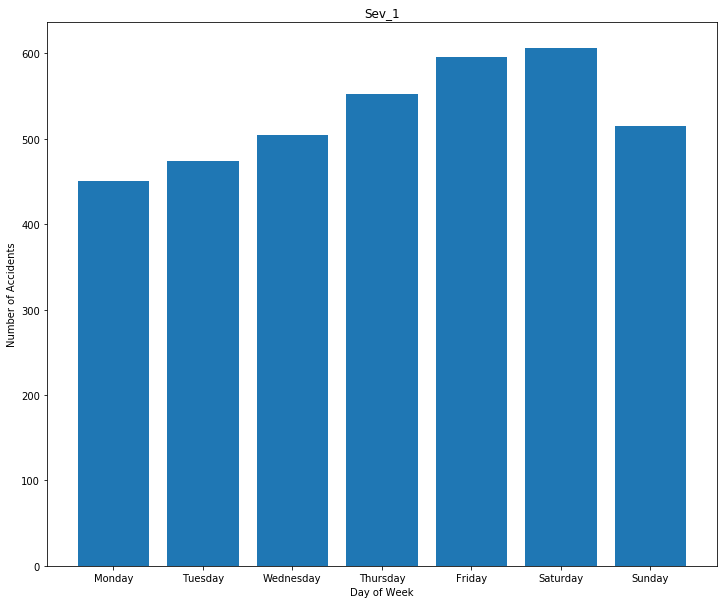

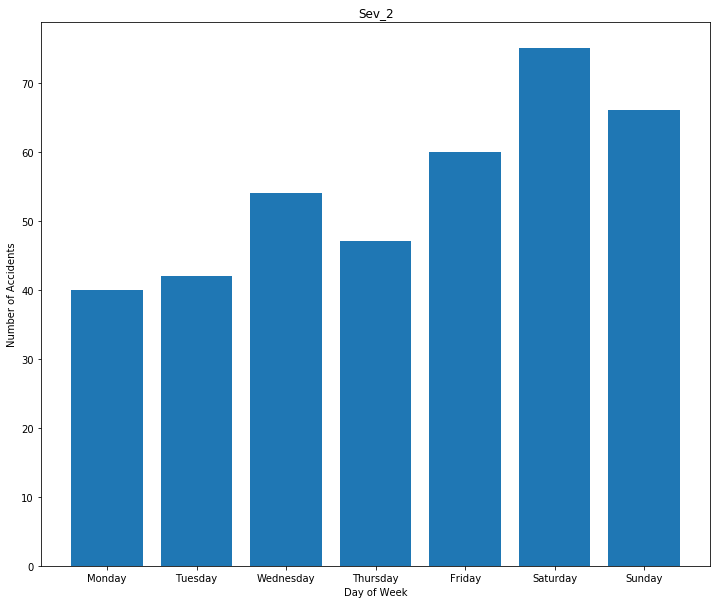

In [60]:
Weekday = np.array(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday','Sunday'])
numWeekday = Weekday.shape[0]

sev0 = df['Weekday'].loc[df['Severity']==0.0].value_counts()
sev1 = df['Weekday'].loc[df['Severity']==1.0].value_counts()
sev2 = df['Weekday'].loc[df['Severity']==2.0].value_counts()

d = {'Weekday': Weekday, 'Sev_0': sev0, 'Sev_1': sev1, 'Sev_2': sev2}
df_Weekday = pd.DataFrame(data=d)

# Create plots
for i in range(3):
    yData = "Sev_" + str(i)
    plt.figure(figsize=(12,10))
    plt.title(yData)
    plt.bar(df_Weekday.Weekday, df_Weekday[yData].to_numpy())
    plt.xlabel('Day of Week')
    plt.ylabel('Number of Accidents')

<h3>Histogram of District IDs</h3>

We can see most of the dataset’s accidents happened in district 3. District 7 does not have much, that is probably the airport.

Text(0.5, 1.0, 'Distribution of Accidents by District Id')

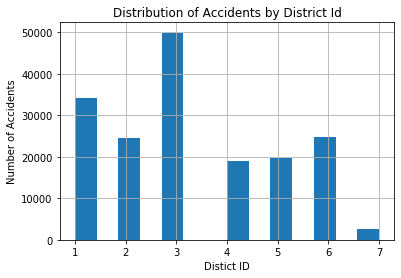

In [61]:
df.hist(column='DISTRICT_ID', bins=14, )
plt.xlabel('Distict ID')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accidents by District Id')

<h2>Modeling</h2>

Now that we have done analysis on our data, we can move on to developing the machine learning models to predict severity. Machine learning is the computers learning based on data. The way they learn is by using algorithms, which are either supervised or unsupervised. A supervised model is when you label and input both input – output data into the algorithm. An example of a supervised would be when building a photo recognition system to identify dogs you input pictures of a dog and tell the algorithm that is a dog. Then you input an unknown picture and the model will predict whether that is a dog. Unsupervised models take unlabeled data and then predicts the cluster that it belongs to. An example is identifying bank transaction fraud, the model alerts you if you a suspicious transaction happens.  For our models we are going to be implementing supervised classification models. This just means that we are going to using algorithms that require input and output labels and then take new data to predict the output. The three models I will be implementing is Decision Tree, K Nearest Neighbor (KNN) and Logistic Regression. A decision tree is a flowchart like structure where each node represents a label. At the end of each branch you get a predicted output. The K Nearest Neighbor  algorithm is a simple way to classify data. It classifies the data by using the nearest neighbors the point, which is the K, a number that indicates how many of the closest neighbors to classify with. Finally, the logistic regression model is a classification technique even though it is called regression. It predicts the probability of a target variable. Since it is a sin function the result is very close to 1 or 0 and that determines the classification of the model.

In [62]:
variable = ['DISTRICT_ID','BICYCLE_IND','PEDESTRIAN_IND','Weekday','Month' ]+Travel_Direction+Light_Condition+Vehicle_Type+Road_Description+Road_Condition
print(variable)
X = df[variable]
y = df['Severity'].values

['DISTRICT_ID', 'BICYCLE_IND', 'PEDESTRIAN_IND', 'Weekday', 'Month', 'Traveling North', 'Traveling South', 'Traveling West', 'Traveling East', 'Day Light', 'Dark Lighted', 'Dawn or Dusk', 'Dark Unlighted', 'Passenger Car/Van', 'Suv', 'Pickup Truck/Utility Van', 'Non Intersection', 'Intersection Related', 'Dry', 'Wet', 'Icy', 'Snowy', 'Slushy']


<h3>Pre Processing & Train Test Split</h3>

We use preprocessing standard scaler to standardize features by removing the mean and scaling to unit variance.

In [63]:
from sklearn import preprocessing
X = preprocessing.StandardScaler().fit(X).transform(X)
X[0:5]

array([[-1.34016167, -0.115798  , -0.14473556, -0.43350189, -1.58789887,
        -0.66248641, -0.61876352,  1.94171857, -0.51322344, -1.57121554,
         1.85308742, -0.20972886, -0.14511693,  0.96952162, -0.52374564,
        -0.39089301, -0.84357386,  1.19543102,  0.40111332, -0.27509988,
        -0.18690564, -0.16607149, -0.08523998],
       [-1.34016167, -0.115798  , -0.14473556, -0.43350189, -1.58789887,
         1.50946492, -0.61876352, -0.51500769, -0.51322344, -1.57121554,
         1.85308742, -0.20972886, -0.14511693,  0.96952162, -0.52374564,
        -0.39089301, -0.84357386,  1.19543102, -2.49306105,  3.63504332,
        -0.18690564, -0.16607149, -0.08523998],
       [-0.75385272, -0.115798  , -0.14473556, -0.43350189, -1.58789887,
        -0.66248641, -0.61876352, -0.51500769,  1.94846909,  0.63644992,
        -0.53963995, -0.20972886, -0.14511693, -1.03143652, -0.52374564,
        -0.39089301,  1.18543266, -0.83651836, -2.49306105, -0.27509988,
        -0.18690564,  6.0215

In [64]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import accuracy_score
from sklearn.metrics import jaccard_score
from sklearn.metrics import f1_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=3, test_size=0.2)

<h3>Decision Tree</h3>

Now we call the decision tree classifier function with criterion of entropy, which measures disorder. Then we fit/train our model with our X train and Y train data. We can now predict with our model by using the predict function and seeing the values that it predicted. Afterwards we measure performance of our decision tree with our test data, these results will be discussed in the results section. 

In [65]:
clf  = DecisionTreeClassifier(criterion='entropy', max_depth=None)
model = clf.fit(X_train, y_train)

In [66]:
tree_pred = model.predict(X_test)
print(tree_pred[0:10])
print('Accuracy score of Decision tree model is: ', accuracy_score(tree_pred, y_test))
print('Jaccard score of Decision tree model is: ', jaccard_score(y_true=y_test, y_pred=tree_pred, average='weighted'))
print('F1 score of Decision tree model is: ', f1_score(y_true=y_test, y_pred=tree_pred, average='weighted'))

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Accuracy score of Decision tree model is:  0.9636749684379663
Jaccard score of Decision tree model is:  0.9420589946374612
F1 score of Decision tree model is:  0.9600697527314367


<h3>K Nearest Neighbor(KNN)</h3>

Our next model is the KNN model. For this model we must define K which is how many neighbors we want our dataset to compare. After running a function that helps determine that I determined that 4 is our ideal neighborhood size. As we do for the decision tree model, we do here by fist calling the K neighbors classifier function and then training it on our X Y training data. We again predict values and measure the performance of our KNN model with test, results will be discussed in the results section.

In [67]:
k = 4
knn = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
knn_pred = knn.predict(X_test)
knn_pred[0:10]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [68]:
print('Accuracy score of K Nearest Neighbor is: ', accuracy_score(knn_pred, y_test))
print('Jaccard score of K Nearest Neighbor is: ', jaccard_score(y_true=y_test, y_pred=knn_pred, average='weighted'))
print('F1 score of K Nearest Neighbor is: ', f1_score(y_true=y_test, y_pred=knn_pred, average='weighted'))

Accuracy score of K Nearest Neighbor is:  0.9756398485022381
Jaccard score of K Nearest Neighbor is:  0.952889453912007
F1 score of K Nearest Neighbor is:  0.9649422913423275


<h2>Logistic Regression</h2>

Our final model is the logistic regression model. Everything is done the same way as other models but in our logistic regression we also create a variable that stores the predicted probabilities from our X test dataset. This will be used to calculate the log loss later, that and other performance measures will be discussed in the results section. 

In [69]:
LR = LogisticRegression(C=0.01, solver='lbfgs').fit(X_train,y_train)
lr_pred = LR.predict(X_test)
yhat_prob = LR.predict_proba(X_test)
lr_pred[0:10]

C:\Users\gyawa\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [70]:
print('Accuracy score of Logistic Regression Model is: ', accuracy_score(y_pred=lr_pred, y_true=y_test))
print('Jaccard score of Logistic Regression model is: ', jaccard_score(y_true=y_test, y_pred=lr_pred, average='weighted'))
print('F1 score of Logistic Regression model is: ', f1_score(y_true=y_test, y_pred=lr_pred, average='weighted'))
print('Log loss score of Logistic Regression model is: ', log_loss(y_test, yhat_prob))

Accuracy score of Logistic Regression Model is:  0.9757259267760817
Jaccard score of Logistic Regression model is:  0.9527321701806759
F1 score of Logistic Regression model is:  0.9646681099772354
Log loss score of Logistic Regression model is:  0.1081727083398997


C:\Users\gyawa\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


<h1> Results & Discussion </h1> <a name="Results&Discussion"></a>

The table below has our performance measures for each of our models that we created. The measurements we use are Accuracy score, Jaccard score, F1 score and Log Loss.

|Model Name| Accuracy Score | Jaccard score | F1 score |Log loss |
|---| --- | --- | --- |---|
|Decision Tree| 0.9636 | 0.9420 | 0.9600 |N/A|
|K NEAREST NEIGHBORS| 0.9756 | 0.9528 | 0.9649 |N/A|
|Logistic Regression| 0.9757 |  0.9527 |0.9646 | 0.1081|

The accuracy score is derived by comparing how accurate the test severity values with actual predicted values from our model.
The Jaccard index or Jaccard similarity coefficient is the size of the intersection divided by the size of the union of two label sets. 

F1 score is the weighted average of precision & recall. Precision is measure of accuracy provided class label has been predicted. Recall is the true positive rate. 

The Log Loss score is used in multinomial log regression, it is defined as the negative log-likelihood of a logistic model that returns y-pred probabilities for its training data (y-true). The predicted output is a probability value between 0 and 1. Since it is closer to 0 there is less uncertainty. 

As we can see from the results of our model all our models turned out to be very accurate with over a 96% accuracy for all three models. Overall, it seems that our logistic regression model has the best accuracy by a slim margin on the accuracy, Jaccard, and F1 score. It has 0.1  for Log Loss which means there is low uncertainty in our mode. Overall, when we evaluate our trained model with our test data it performs very well. If I had a completely different dataset to evaluate against my model it would be interesting to see how it would perform then. 

<h3>Discussion</h3>

There was a massive amount of data here and analysis really brought a lot of different things to attention. In this section I will bring up the main things that caught my attention. If you would like to make your own analysis based on my data and analysis the notebook will contain more. 

The first thing that was alarming was addresses and the amount of accidents that happened at each accident. Because there were 39769 unique addresses in this dataset it would not have been feasible to do further analysis on this column or implement it into our ML models. However, when seeing the accidents its not surprising that most accidents happen on interstates. What was alarming was that 6th ave was the top address and showed up 3 times in the top 10 accounting for 2306 accidents. From personal experience it feels a little dangerous driving around there and I would recommend CDOT and county of Denver investigate why this is. 

Another the stands out is the correlation between pedestrians and severity. All other columns have very low correlation with severity, and that is expected since severity of 0 is so common in the dataset. However, the correlation is significantly higher for pedestrians which is 0.2. It would make sense that if a pedestrian is involved in a car accident that raises severity significantly higher. But since it is the variable with the highest correlation that should remind us as pedestrians, we need to be extra vigilant.

When looking at severity of accidents and time, interesting conclusions can be made.  First when comparing year by year we can see the total amount of severity 0 accidents has stayed steady over the past years but will most likely fall drastically this year. It will be interesting to see the effects of Covid on this trend once this year finishes. Something alarming is that total amount of fatal car crashes has been increasing year by year. Once we get beyond 2020 it will be interesting to see if this trend continues. When we compare severity and month, we notice first that summer months and January have the highest amount of severity 0 accidents. August has the highest amount of accidents that are severity 1. Finally, we can see that fatal accidents peak in July and stays relatively higher in summer months. When we look at accident severity and weekday, we notice first that the major bulk of severity 0 accidents happen in the weekdays starting lower on Monday and peaking Fridays. My guess would be that more people are driving in the weekday for work and rushing home and being less careful on Fridays. When looking at severity 1 and 2 accidents and day of week we notice that the inverse is true. Most of fatal and injury accidents happen during the weekend. People tend to be more irresponsible and carefree in the weekend this should be another reminder to take time to be more responsible when we are out relaxing during our time off. 

<h1> Conclusion </h1> <a name="Conclusion"></a>

I want to emphasize that every life is valuable. In a post Covid world I hope we do not become desensitized to total deaths or death rates. Let us not get caught in a game of numbers and percentages and focus on trying to save as many lives as we can. In this report I outlined how I transformed a csv file using python pandas. I explored this dataset, cleansed it, and performed analysis. Finally, I developed 3 supervised ML models to predict how severe an accident will be. It is clear through my analysis and models that we can predict the severity of an accident based on different conditions and variables. I want to remind everyone that these conditions do not control everything, and we are still the main drivers of these cars. We all have a major part in limiting the severity and can try to be better drivers, pedestrians and bikers because at the end of the day we are all just trying to get to our destinations safely.  

<h1>Map</h1> <a name="Map"></a>

Even though it was not required I wanted to create a map that visualizes where the accident happened, and the traffic offense related to it. It is an interactive folium map that can be zoomed into and when you click on each dot it tells you what traffic offense that accident was.

In [71]:
#!conda install -c conda-forge folium=0.5.0 --yes
import folium

In [72]:
df_geo.info()
df_geo

<class 'pandas.core.frame.DataFrame'>
Int64Index: 167464 entries, 1 to 182147
Data columns (total 4 columns):
GEO_LON                         167464 non-null float64
GEO_LAT                         167464 non-null float64
Severity                        167464 non-null float64
TOP_TRAFFIC_ACCIDENT_OFFENSE    167464 non-null object
dtypes: float64(3), object(1)
memory usage: 6.4+ MB


,GEO_LON,GEO_LAT,Severity,TOP_TRAFFIC_ACCIDENT_OFFENSE
OBJECTID_1,,,,
1,-105.025220,39.740476,0.0,TRAF - ACCIDENT - HIT & RUN
2,-104.992859,39.728937,0.0,TRAF - ACCIDENT
3,-104.929109,39.763614,0.0,TRAF - ACCIDENT - HIT & RUN
4,-104.991179,39.784074,0.0,TRAF - ACCIDENT
5,-105.006428,39.783265,0.0,TRAF - ACCIDENT - DUI/DUID
6,-104.986220,39.759232,0.0,TRAF - ACCIDENT - HIT & RUN
7,-104.991608,39.685710,0.0,TRAF - ACCIDENT
8,-105.039368,39.709327,0.0,TRAF - ACCIDENT
9,-104.991912,39.756163,0.0,TRAF - ACCIDENT


In [73]:
limit = 10000

df_geo_sev0 = df_geo.loc[df_geo['Severity']==0.0]
print('The count of severity level 0 before dropping is:',df_geo_sev0['Severity'].value_counts())
df_geo_sev0 = df_geo_sev0.iloc[0:limit, :]
df_geo_sev1 = df_geo.loc[df_geo['Severity']==1.0]
df_geo_sev2 = df_geo.loc[df_geo['Severity']==2.0]

print(df_geo_sev0['Severity'].value_counts())
print(df_geo_sev1['Severity'].value_counts())
print(df_geo_sev2['Severity'].value_counts())


The count of severity level 0 before dropping is: 0.0    163530
Name: Severity, dtype: int64
0.0    10000
Name: Severity, dtype: int64
1.0    3567
Name: Severity, dtype: int64
2.0    367
Name: Severity, dtype: int64


In [74]:
denver_latitude = 39.742043
denver_longitude = -104.991531

denver_map = folium.Map(location=[denver_latitude, denver_longitude], zoom_start=11)

In [75]:
incidents = folium.map.FeatureGroup()

for lat, lng, label in zip(df_geo_sev0.GEO_LAT, df_geo_sev0.GEO_LON, df_geo_sev0.TOP_TRAFFIC_ACCIDENT_OFFENSE):
    folium.features.CircleMarker(
        [lat, lng],
        radius=4, 
        color='Black',
        fill=True,
        popup=label,
        fill_color='green',
        fill_opacity=0.6,
        legend_name='Severity Level',
    ).add_to(denver_map)
    
for lat, lng, label in zip(df_geo_sev1.GEO_LAT, df_geo_sev1.GEO_LON, df_geo_sev1.TOP_TRAFFIC_ACCIDENT_OFFENSE):
    folium.features.CircleMarker(
        [lat, lng],
        radius=5, 
        color='black',
        fill=True,
        popup=label,
        fill_color='yellow',
        fill_opacity=0.6,
        legend_name='Severity Level',
    ).add_to(denver_map)
    
for lat, lng, label in zip(df_geo_sev2.GEO_LAT, df_geo_sev2.GEO_LON, df_geo_sev2.TOP_TRAFFIC_ACCIDENT_OFFENSE):
    folium.features.CircleMarker(
        [lat, lng],
        radius=6, 
        color='black',
        fill=True,
        popup=label,
        fill_color='red',
        fill_opacity=0.6,
        legend_name='Severity Level',
    ).add_to(denver_map)
    
denver_map